<a href="https://colab.research.google.com/github/olusegvn/covid-19-detector/blob/main/Final_Year_Project_COVID_19_Diagnosis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !echo > docker-compose.yml << EOF
# version: '3'
# services:
#   s3bucketftp:
#     container_name: s3bucketftp
#     privileged: true
#     tty: true
#     build:
#       context: ./
#       args:
#         environment: development
# EOF

In [ ]:
# !sudo curl -L "https://github.com/docker/compose/releases/download/1.26.0/docker-compose-$(uname -s)-$(uname -m)"  -o /usr/local/bin/docker-compose
# !sudo mv /usr/local/bin/docker-compose /usr/bin/docker-compose
# !sudo chmod +x /usr/bin/docker-compose
# !git clone --recursive https://github.com/Parisson/TimeSide.git
# !cd TimeSide
# !docker-compose pull
# !python --version 



Python 3.7.10


In [ ]:
# !pip install TimeSide==0.9.6
!pip install catboost
# !pip install keras==2.1.6

     |████████████████████████████████| 67.4 MB 28 kB/s 


In [ ]:
import cv2
import wave
import pylab
import xgboost
import catboost
from catboost import CatBoostClassifier, metrics
from scipy.io import wavfile
import sklearn
import tensorflow as tf
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import os
from joblib import dump, load
from sklearn.svm import SVC
from scipy import signal
from tensorflow.keras import Sequential
from sklearn.metrics import balanced_accuracy_score
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Activation, Conv2D, ConvLSTM2D, MaxPooling2D, Flatten, GlobalAveragePooling2D, Input, Dropout
import matplotlib.pyplot as plt
import xgboost as xgb
from google.colab import drive
print(catboost.__version__)

drive.mount('/content/drive', force_remount=True)
os.chdir('/content/drive/My Drive/Colab Notebooks/')
plt.rcParams["figure.figsize"] = (10,10)

0.26.1
Mounted at /content/drive


In [ ]:
cough_abstract_data = pd.read_csv('Datasets/cough_trial_extended.csv')
data_new_extended = pd.read_csv('Datasets/data_new_extended.csv')

In [ ]:
# [plt.plot(data_new_extended[_]) for _ in data_new_extended]
# plt.show()

Preprocessing sound files.

Creating AI for sound data

THERE IS BIG PROBLEM, THE LISTS ARE OF UNEQUAL SHAPES.
TRY INDEXING TO BUILD LIST INSTEAD OF APPENDING

In [ ]:
# sound_x, sound_y = [], []
# for file in os.listdir('Datasets/trial_covid'):
#     fs, data = wavfile.read(os.path.join("Datasets/trial_covid", file))
#     try:
#         data = (data[:,0] + data[:,1]) / 2
#     except IndexError:
#         pass
#     sound_x.append(data)
#     row = cough_abstract_data[cough_abstract_data['file_properties'] == file]
#     row2 = data_new_extended[data_new_extended['filename'] == file]
#     # if row.empty and row2.empty:
#     #     print(file.split(' ')[0])
#     sound_y.append(cough_abstract_data.iloc[row.index]['class'].values.tolist()[0]) if not row.empty else sound_y.append(data_new_extended.iloc[row2.index]['label'].values.to_list()[0])

# # print(any(r.empty for r in sound_y))
# sound_y = np.array(pd.factorize(sound_y)[0])
# sound_y = tf.keras.utils.to_categorical(sound_y, 2)
# sound_x = pd.DataFrame(sound_x, dtype='float32')
# sound_x = sound_x.fillna(0.0).values

In [ ]:
# print(sound_x.shape)
# np.savetxt("sound_x.csv", sound_x, delimiter=",")
# np.savetxt("sound_y.csv", sound_y, delimiter=",")


In [ ]:
# sound_x = np.loadtxt("sound_x.csv", delimiter=",")
# sound_y = np.loadtxt("sound_y.csv", delimiter=",")
# print(sound_x.shape)

In [ ]:
def residual_block(x, filters, conv_num=3, activation="relu"):
    # Shortcut
    s = tf.keras.layers.Conv1D(filters, 1, padding="same")(x)
    for i in range(conv_num - 1):
        x = tf.keras.layers.Conv1D(filters, 3, padding="same")(x)
        x = tf.keras.layers.Activation(activation)(x)
    x = tf.keras.layers.Conv1D(filters, 3, padding="same")(x)
    x = tf.keras.layers.Add()([x, s])
    x = tf.keras.layers.Activation(activation)(x)
    return tf.keras.layers.MaxPool1D(pool_size=2, strides=2)(x)


def build_model(input_shape, num_classes):
    inputs = tf.keras.layers.Input(shape=input_shape, name="input")

    x = residual_block(inputs, 16, 2)
    x = residual_block(x, 32, 2)
    x = residual_block(x, 64, 3)
    x = residual_block(x, 128, 3)
    x = residual_block(x, 128, 3)

    x = tf.keras.layers.AveragePooling1D(pool_size=3, strides=3)(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(256, activation="relu")(x)
    x = tf.keras.layers.Dense(128, activation="relu")(x)

    outputs = tf.keras.layers.Dense(num_classes, activation="softmax", name="output")(x)

    return tf.keras.models.Model(inputs=inputs, outputs=outputs)


sound_rnn_model = build_model((1277952, 1), 2)

sound_rnn_model.summary()

sound_rnn_model.compile(loss = tf.keras.losses.BinaryCrossentropy(from_logits=False), 
                              metrics=[tf.keras.metrics.Recall(), tf.keras.metrics.BinaryAccuracy()], 
                              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))

# 'ModelCheckPoint' to always keep the model that has the best val_accuracy
model_save_filename = "sound_rnn_model.h5"

mdlcheckpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    model_save_filename, monitor="val_binary_accuracy", save_best_only=True
)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 1277952, 1)] 0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1277952, 16)  64          input[0][0]                      
__________________________________________________________________________________________________
activation (Activation)         (None, 1277952, 16)  0           conv1d_1[0][0]                   
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 1277952, 16)  784         activation[0][0]                 
______________________________________________________________________________________________

In [ ]:
# sound_x = np.asarray(sound_x).astype(np.float32)
# sound_y - np.asarray(sound_y).astype(np.float32)
# sound_x_train, sound_x_test, sound_y_train, sound_y_test = train_test_split(sound_x, sound_y, test_size=0.53, random_state=42)
# # sound_x_train=sound_x_train.reshape(sound_x_train.shape[0],1,sound_x_train.shape[1])

# sound_train_dataset = tf.data.Dataset.from_tensor_slices((sound_x_train, sound_y_train))
# sound_test_dataset = tf.data.Dataset.from_tensor_slices((sound_x_test, sound_y_test))
# sound_train_dataset = sound_train_dataset.batch(1)
# sound_test_dataset = sound_test_dataset.batch(1)

# sound_rnn_model.fit(sound_train_dataset, epochs=100, validation_data=(sound_test_dataset),
#                     callbacks=[mdlcheckpoint_cb])


Converting sound files to spectrograms

Image Data processing

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  """
/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


KeyboardInterrupt: ignored

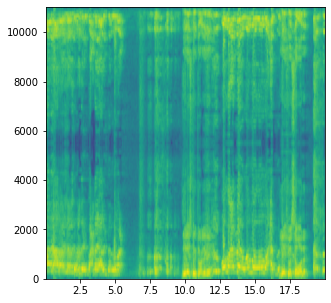

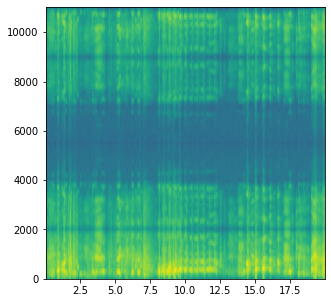

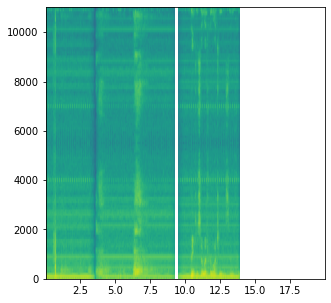

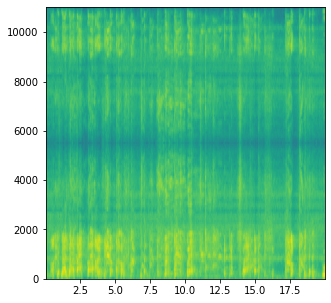

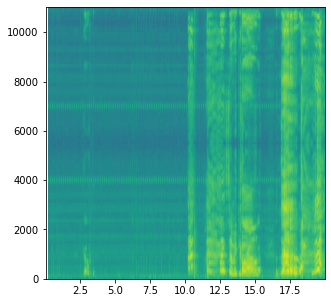

...

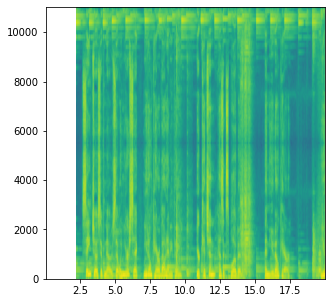

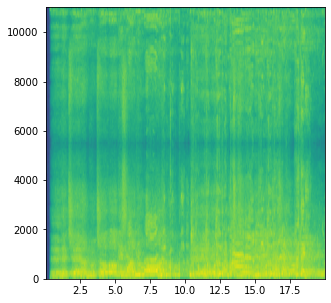

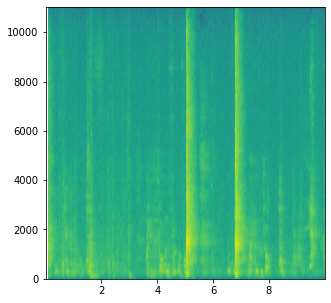

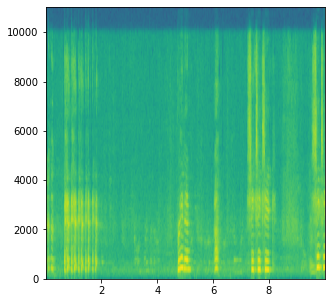

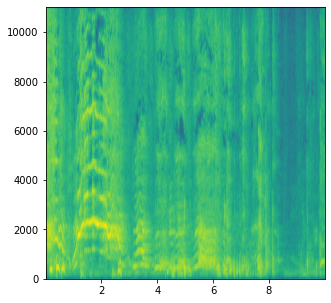

In [ ]:
def create_other_spectrograms():
  for file in os.listdir('Datasets/trial_covid/'):
    wav = wave.open('Datasets/trial_covid/'+file, 'r')
    frames = wav.readframes(-1)
    sound_info = pylab.fromstring(frames, 'Int16')
    frame_rate = wav.getframerate()
    wav.close()
    pylab.figure(num=None, figsize=(5, 5))
    pylab.subplot(111)
    pylab.specgram(sound_info, Fs=frame_rate)
    pylab.savefig('Datasets/stectrograms_created_from_trial_covid/'+file+'.png')
create_other_spectrograms()

In [ ]:
def load_images_from_folder(folder, images=[]):
    for filename in os.listdir(folder):
        img = cv2.cvtColor(cv2.resize(cv2.imread(os.path.join(folder,filename)), (331, 331)), cv2.COLOR_BGR2GRAY)
        images.append(np.expand_dims(img, axis=2))
    return images
  
  

In [ ]:
# positive_samples = np.array(load_images_from_folder("Datasets/covid spectrograms/positive_Covid-19"), dtype='float32')
# positive_samples[2]
# negative_samples = load_images_from_folder('Datasets/covid spectrograms/negative_Covid-19')
# print(positive_samples.shape)

In [ ]:
_x = load_images_from_folder('Datasets/covid spectrograms/negative_Covid-19')
len_x = len(_x)
_y = np.zeros((len_x, 1))
covid_spectrograms_x = np.array(load_images_from_folder("Datasets/covid spectrograms/positive_Covid-19", _x), dtype='float32')
covid_spectrograms_y = np.vstack((_y, np.ones((len(covid_spectrograms_x)-len_x, 1))))

In [ ]:
print(covid_spectrograms_x.shape)
print(covid_spectrograms_y.shape)

(1934, 331, 331, 1)
(1934, 1)


In [ ]:
created_covid_spectrograms_x = []
created_covid_spectrograms_y = []
for file in os.listdir('Datasets/stectrograms_created_from_trial_covid/'):
    img = np.expand_dims(cv2.cvtColor(cv2.resize(cv2.imread(os.path.join('Datasets/stectrograms_created_from_trial_covid/',file)), (331, 331)), cv2.COLOR_BGR2GRAY), axis=2)
    created_covid_spectrograms_x.append(img)
    row = cough_abstract_data[cough_abstract_data['file_properties']+'.png' == file]
    row2 = data_new_extended[data_new_extended['filename'] == file]
    main_row = row if row2.empty else row2
    if all(main_row['class'] == 'covid'):
      created_covid_spectrograms_y.append([1])
      # positive_samples = np.vstack((positive_samples, np.expand_dims(img, axis=0)))
    elif all(main_row['class'] == 'not_covid'):
      created_covid_spectrograms_y.append([0])
      # negative_samples = np.vstack((negative_samples, np.expand_dims(img, axis=0)))
    else:
       print('flag')
    # print(negative_samples.shape)
    
created_covid_spectrograms_x = np.array(created_covid_spectrograms_x)
created_covid_spectrograms_y = np.array(created_covid_spectrograms_y)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
print(created_covid_spectrograms_x.shape)
print(created_covid_spectrograms_y.shape)

(166, 331, 331, 1)
(166, 1)


In [ ]:
# x_positive_train, x_positive_test = sklearn.model_selection.train_test_split(positive_samples, random_state=None, test_size=0.3, shuffle=False)
# x_negative_train, x_negative_test = sklearn.model_selection.train_test_split(negative_samples, random_state=None, test_size=0.3, shuffle=False)

covid_spectrograms_x_train, covid_spectrograms_x_test, covid_spectrograms_y_train, covid_spectrograms_y_test = train_test_split(
    covid_spectrograms_x, covid_spectrograms_y, shuffle=True, test_size=0.33
)

In [ ]:
created_covid_spectrograms_x_train, created_covid_spectrograms_x_test, created_covid_spectrograms_y_train, created_covid_spectrograms_y_test = train_test_split(
    created_covid_spectrograms_x, created_covid_spectrograms_y, shuffle=True, test_size=0.33
)

In [ ]:
print(covid_spectrograms_x_train.shape)
print(covid_spectrograms_x_test.shape)
print(covid_spectrograms_y_train.shape)
print(covid_spectrograms_y_test.shape)


(1295, 331, 331, 1)
(639, 331, 331, 1)
(1295, 1)
(639, 1)


In [ ]:
print(created_covid_spectrograms_x_train.shape)
print(created_covid_spectrograms_y_train.shape)
print(created_covid_spectrograms_x_test.shape)
print(created_covid_spectrograms_y_test.shape)


(111, 331, 331, 1)
(111, 1)
(55, 331, 331, 1)
(55, 1)


In [ ]:
full_spectrogram_dataset_x = np.vstack((covid_spectrograms_x, created_covid_spectrograms_x))
full_spectrogram_dataset_y = np.vstack((covid_spectrograms_y, created_covid_spectrograms_y))

full_spectrogram_dataset_x_train, full_spectrogram_dataset_x_test, full_spectrogram_dataset_y_train, full_spectrogram_dataset_y_test = train_test_split(
    full_spectrogram_dataset_x, full_spectrogram_dataset_y, shuffle=True, test_size=0.33
)

In [ ]:
print(full_spectrogram_dataset_x_train.shape)
print(full_spectrogram_dataset_x_test.shape)
print(full_spectrogram_dataset_y_train.shape)
print(full_spectrogram_dataset_y_test.shape)


(1407, 331, 331, 1)
(693, 331, 331, 1)
(1407, 1)
(693, 1)


In [ ]:
full_spectrogram_training_dataset = tf.data.Dataset.from_tensor_slices((tf.image.grayscale_to_rgb(tf.convert_to_tensor(full_spectrogram_dataset_x_train)), 
                                                              full_spectrogram_dataset_y_train))
full_spectrogram_validation_dataset = tf.data.Dataset.from_tensor_slices((tf.image.grayscale_to_rgb(tf.convert_to_tensor(full_spectrogram_dataset_x_test)), 
                                                              full_spectrogram_dataset_y_test))
full_spectrogram_training_dataset.element_spec
full_spectrogram_training_dataset = full_spectrogram_training_dataset.batch(5)
full_spectrogram_validation_dataset = full_spectrogram_validation_dataset.batch(5)

In [ ]:
# images_x_train = np.expand_dims(np.append(x_positive_train, x_negative_train, axis=0), axis=3)
# images_x_test = np.expand_dims(np.append(x_positive_test, x_negative_test, axis=0), axis=3)
# images_y_train = np.append(np.ones((len(x_positive_train), 1)), np.zeros((len(x_negative_train), 1)))
# images_y_test = np.append(np.ones((len(x_positive_test), 1)), np.zeros((len(x_negative_test), 1)))


please confirm dataset was created properly.





In [ ]:
base_model = tf.keras.applications.Xception(weights='imagenet', include_top=False) # 0.4666
# base_model = tf.keras.applications.NASNetLarge(weights='imagenet', include_top=False) # 0.39
# base_model = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False) # 1.01
# base_model = tf.keras.applications.EfficientNetB7(weights='imagenet', include_top=False) # 0.003
base_model.summary()

83689472/83683744 [==============================] - 3s 0us/step
Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, None, None, 3 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, None, None, 3 0           block1_conv1_bn[0][0]            
__________________________

In [ ]:
# spectrogram_cnn_model = Sequential([
#                     base_model,
#                     GlobalAveragePooling2D,
#                     Flatten(),
#                     Dense(10, activation='relu'),
#                     Dense(1, activation='relu')
# ])


inputs = Input(shape=(331, 331, 3))
# inputs = Conv2D(filters=3, padding='same', kernel_size=(3, 3))(_inputs)
x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
# x = Dropout(0.2)(x)  # Regularize with dropout
x = Dense(64, activation='relu')(x)
x = Dense(32, activation='relu')(x)
x = Dense(10, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)
spectrogram_cnn_model = tf.keras.Model(inputs, outputs)
spectrogram_cnn_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 331, 331, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, None, None, 2048)  20861480  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 64)                131136    
_________________________________________________________________
dense_9 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_10 (Dense)             (None, 10)                330       
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 11  

In [ ]:
model_save_filename = "spectrogram_cnn_model.h5"

mdlcheckpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    model_save_filename, monitor="val_binary_accuracy", save_best_only=True
)

In [ ]:

spectrogram_cnn_model = tf.keras.models.load_model('spectrogram_cnn_model.h5')
# spectrogram_cnn_model.compile(loss = tf.keras.losses.BinaryCrossentropy(from_logits=False), 
#                               metrics=[tf.keras.metrics.Recall(), tf.keras.metrics.BinaryAccuracy()], 
#                               optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001))
# history = spectrogram_cnn_model.fit(full_spectrogram_training_dataset,
#                                     validation_data=full_spectrogram_validation_dataset, 
#                                     epochs=1, callbacks=[mdlcheckpoint_cb])

In [ ]:
# spectrogram_cnn_model.save('spectrogram_cnn_model.h5')
# spectrogram_cnn_model = load('spectrogram_cnn_model.joblib') 

**CatBoost model**

In [ ]:
_f = lambda _ : _.flatten() 

In [ ]:
catboost_covid_spectrograms_x_train = np.array(list(map(_f, full_spectrogram_dataset_x_train)))
catboost_covid_spectrograms_x_test = np.array(list(map(_f, full_spectrogram_dataset_x_test)))

In [ ]:
catboost_created_covid_spectrograms_x_train = np.array(list(map(_f, created_covid_spectrograms_x_train)))
catboost_created_covid_spectrograms_x_test = np.array(list(map(_f, created_covid_spectrograms_x_test)))


In [ ]:
print(catboost_covid_spectrograms_x_train.shape)
print(catboost_covid_spectrograms_x_test.shape)
print(catboost_created_covid_spectrograms_x_train.shape)
print(catboost_created_covid_spectrograms_x_test.shape)

(1407, 109561)
(693, 109561)
(111, 109561)
(55, 109561)


In [ ]:
# covid_spectrograms_catboost_model_1 = CatBoostClassifier(iterations=450, task_type="GPU")
# covid_spectrograms_catboost_model_1.fit(catboost_covid_spectrograms_x_train[:, :36520], full_spectrogram_dataset_y_train, 
#                                       eval_set=(catboost_covid_spectrograms_x_test[:, :36520], full_spectrogram_dataset_y_test), use_best_model=True)
# dump(covid_spectrograms_catboost_model_1, 'covid_spectrograms_catboost_model_1.joblib')

# covid_spectrograms_catboost_model_2 = CatBoostClassifier(iterations=450, task_type="GPU")
# covid_spectrograms_catboost_model_2.fit(catboost_covid_spectrograms_x_train[:, 36521:73040], full_spectrogram_dataset_y_train, 
#                                       eval_set=(catboost_covid_spectrograms_x_test[:, 36521:73040], full_spectrogram_dataset_y_test), use_best_model=True)
# dump(covid_spectrograms_catboost_model_2, 'covid_spectrograms_catboost_model_2.joblib')

# covid_spectrograms_catboost_model_3 = CatBoostClassifier(iterations=450, task_type="GPU")
# covid_spectrograms_catboost_model_3.fit(catboost_covid_spectrograms_x_train[:, 73040:], full_spectrogram_dataset_y_train, 
#                                       eval_set=(catboost_covid_spectrograms_x_test[:, 73040:], full_spectrogram_dataset_y_test), use_best_model=True)
# dump(covid_spectrograms_catboost_model_3, 'covid_spectrograms_catboost_model_3.joblib')


In [ ]:
covid_spectrograms_catboost_model_1 = load('covid_spectrograms_catboost_model_1.joblib') 
covid_spectrograms_catboost_model_2 = load('covid_spectrograms_catboost_model_2.joblib') 
covid_spectrograms_catboost_model_3 = load('covid_spectrograms_catboost_model_3.joblib') 


In [ ]:
# covid_spectrograms_SVC_model = SVC(probability=True)
# covid_spectrograms_SVC_model.fit(catboost_covid_spectrograms_x_train, full_spectrogram_dataset_y_train)
# dump(covid_spectrograms_SVC_model, 'covid_spectrograms_SVC_model.joblib')
covid_spectrograms_SVC_model = load('covid_spectrograms_SVC_model.joblib') 

In [ ]:

print(balanced_accuracy_score(full_spectrogram_dataset_y_train, covid_spectrograms_SVC_model.predict(catboost_covid_spectrograms_x_train)))

print(balanced_accuracy_score(full_spectrogram_dataset_y_test, covid_spectrograms_SVC_model.predict(catboost_covid_spectrograms_x_test)))

0.6620795107033639
0.6366666666666667


In [ ]:
# covid_spectrograms_logistic_regression_model = sklearn.linear_model.LogisticRegression('l2',solver='liblinear')
# covid_spectrograms_logistic_regression_model.fit(catboost_covid_spectrograms_x_train, full_spectrogram_dataset_y_train)
covid_spectrograms_logistic_regression_model = load('covid_spectrograms_logistic_regression_model.joblib') 

In [ ]:
print(balanced_accuracy_score(full_spectrogram_dataset_y_train, covid_spectrograms_logistic_regression_model.predict(catboost_covid_spectrograms_x_train)))

print(balanced_accuracy_score(full_spectrogram_dataset_y_test, covid_spectrograms_logistic_regression_model.predict(catboost_covid_spectrograms_x_test)))

0.9013892214869372
0.9125593618885149


In [ ]:
# covid_spectrograms_xgboost_model = xgb.XGBClassifier(max_depth=4, learning_rate=0.1, n_estimators=200,
#                               silent=False, objective='binary:logistic') # n_estimators
# covid_spectrograms_xgboost_model.fit(catboost_covid_spectrograms_x_train, full_spectrogram_dataset_y_train) 
covid_spectrograms_xgboost_model = load('covid_spectrograms_xgboost_model.joblib')

In [ ]:
print(balanced_accuracy_score(full_spectrogram_dataset_y_train, covid_spectrograms_xgboost_model.predict(catboost_covid_spectrograms_x_train)))

print(balanced_accuracy_score(full_spectrogram_dataset_y_test, covid_spectrograms_xgboost_model.predict(catboost_covid_spectrograms_x_test)))

0.9155793408086986
0.9139042357274402


In [ ]:
# dump(covid_spectrograms_logistic_regression_model, 'covid_spectrograms_logistic_regression_model.joblib') 
# dump(covid_spectrograms_SVC_model, 'covid_spectrograms_SVC_model.joblib') 
# dump(covid_spectrograms_xgboost_model, 'covid_spectrograms_xgboost_model.joblib') 


In [ ]:
# created_covid_spectrograms_SVC_model = sklearn.svm.svc()
# created_covid_spectrograms_SVC_model.fit(catboost_created_covid_spectrograms_x_train, created_covid_spectrograms_y_train, 
#                                       eval_set=(catboost_created_covid_spectrograms_x_test, created_covid_spectrograms_y_test), use_best_model=True)

**Level One training**

In [ ]:

# meta_images_train_x = []
# for file in os.listdir('Datasets/stectrograms_created_from_trial_covid/'):
#     img = cv2.cvtColor(cv2.resize(cv2.imread(os.path.join('Datasets/stectrograms_created_from_trial_covid/',file)), (331, 331)), cv2.COLOR_BGR2GRAY)
#     meta_images_train_x.append(img)

In [ ]:
catboost_covid_spectrograms_x_train.shape

(1407, 109561)

In [ ]:
meta_model_x_train = np.hstack((
    # covid_spectrograms_SVC_model.predict_proba(catboost_covid_spectrograms_x_train),
                                covid_spectrograms_catboost_model_1.predict_proba(catboost_covid_spectrograms_x_train[:, :36520]),
                                covid_spectrograms_catboost_model_2.predict_proba(catboost_covid_spectrograms_x_train[:, 36521:73040]),
                                covid_spectrograms_catboost_model_3.predict_proba(catboost_covid_spectrograms_x_train[:, 73040:]),
                                covid_spectrograms_logistic_regression_model.predict_proba(catboost_covid_spectrograms_x_train),
                                covid_spectrograms_xgboost_model.predict_proba(catboost_covid_spectrograms_x_train),
                                # spectrogram_cnn_model.predict(tf.image.grayscale_to_rgb(tf.convert_to_tensor(full_spectrogram_dataset_x_train))),
                                ))
meta_model_x_test= np.hstack((
    # covid_spectrograms_SVC_model.predict_proba(catboost_covid_spectrograms_x_test),
                                covid_spectrograms_catboost_model_1.predict_proba(catboost_covid_spectrograms_x_test[:, :36520]),
                                covid_spectrograms_catboost_model_2.predict_proba(catboost_covid_spectrograms_x_test[:, 36521:73040]),
                                covid_spectrograms_catboost_model_3.predict_proba(catboost_covid_spectrograms_x_test[:, 73040:]),
                                covid_spectrograms_logistic_regression_model.predict_proba(catboost_covid_spectrograms_x_test),
                                covid_spectrograms_xgboost_model.predict_proba(catboost_covid_spectrograms_x_test),
                                # spectrogram_cnn_model.predict(tf.image.grayscale_to_rgb(tf.convert_to_tensor(full_spectrogram_dataset_x_test))),
                                ))
meta_model_y_train = full_spectrogram_dataset_y_train
meta_model_y_test = full_spectrogram_dataset_y_test

# meta_model_x_train = load('cifar_10_meta_model_x_train')
# dump(meta_model_x_test, 'cifar_10_meta_model_x_test')


In [ ]:
print(meta_model_x_test.shape)
print(meta_model_y_test.shape)

meta_model_x_train[:5]


In [ ]:
logistic_regression_meta_model = sklearn.linear_model.LogisticRegression(solver='liblinear')
logistic_regression_meta_model.fit(meta_model_x_train, meta_model_y_train)
print(balanced_accuracy_score(meta_model_y_train, logistic_regression_meta_model.predict(meta_model_x_train)))

print(balanced_accuracy_score(meta_model_y_test, logistic_regression_meta_model.predict(meta_model_x_test)))

0.9661290322580645
0.9780913458254594


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
xgboost_meta_model = xgb.XGBClassifier(max_depth=7, learning_rate=0.001, n_estimators=400,
                              silent=False, objective='binary:logistic') # n_estimators
xgboost_meta_model.fit(meta_model_x_train, meta_model_y_train)
print(balanced_accuracy_score(meta_model_y_train, xgboost_meta_model.predict(meta_model_x_train)))
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_train, xgboost_meta_model.predict(meta_model_x_train))
print(m.result().numpy())
m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_train, xgboost_meta_model.predict(meta_model_x_train))
print(m.result().numpy())

print(balanced_accuracy_score(meta_model_y_test, xgboost_meta_model.predict(meta_model_x_test)))
m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_test, xgboost_meta_model.predict(meta_model_x_test))
print(m.result().numpy())
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_test, xgboost_meta_model.predict(meta_model_x_test))
print(m.result().numpy())

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:268: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.9920127795527156
1.0
0.99545044
0.9859145188805385
0.99246705
0.9962193


In [ ]:
catboost_meta_model = CatBoostClassifier(iterations=1000, task_type="GPU", custom_loss=[metrics.Recall()])
catboost_meta_model.fit(meta_model_x_train, meta_model_y_train, 
                                      eval_set=(meta_model_x_test, meta_model_y_test), use_best_model=True)
print(balanced_accuracy_score(meta_model_y_train, catboost_meta_model.predict(meta_model_x_train)))
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_train, catboost_meta_model.predict(meta_model_x_train))
print(m.result().numpy())
m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_train, catboost_meta_model.predict(meta_model_x_train))
print(m.result().numpy())

print(balanced_accuracy_score(meta_model_y_test, catboost_meta_model.predict(meta_model_x_test)))
m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_test, catboost_meta_model.predict(meta_model_x_test))
print(m.result().numpy())
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_test, catboost_meta_model.predict(meta_model_x_test))
print(m.result().numpy())

Learning rate set to 0.06917


0:	learn: 0.5130418	test: 0.5126441	best: 0.5126441 (0)	total: 50.9ms	remaining: 50.8s
1:	learn: 0.4037398	test: 0.4023345	best: 0.4023345 (1)	total: 99.1ms	remaining: 49.5s
2:	learn: 0.3174767	test: 0.3150066	best: 0.3150066 (2)	total: 147ms	remaining: 48.9s
3:	learn: 0.2402209	test: 0.2375066	best: 0.2375066 (3)	total: 195ms	remaining: 48.6s
4:	learn: 0.1983985	test: 0.1963131	best: 0.1963131 (4)	total: 213ms	remaining: 42.4s
5:	learn: 0.1564954	test: 0.1556554	best: 0.1556554 (5)	total: 253ms	remaining: 41.9s
6:	learn: 0.1347806	test: 0.1342202	best: 0.1342202 (6)	total: 273ms	remaining: 38.7s
7:	learn: 0.1132869	test: 0.1122643	best: 0.1122643 (7)	total: 310ms	remaining: 38.4s
8:	learn: 0.0979570	test: 0.0974219	best: 0.0974219 (8)	total: 344ms	remaining: 37.8s
9:	learn: 0.0825616	test: 0.0822442	best: 0.0822442 (9)	total: 378ms	remaining: 37.5s
10:	learn: 0.0739148	test: 0.0734275	best: 0.0734275 (10)	total: 412ms	remaining: 37.1s
11:	learn: 0.0627813	test: 0.0628033	best: 0.06280

In [ ]:
dump(catboost_meta_model, 'catboost_meta_model.joblib')

In [ ]:
meta_model=  Sequential([
                         Dense(50, activation='tanh'),
                         Dense(20, activation='tanh'),
                         Dense(1, activation='sigmoid')
])
# meta_model = tf.keras.models.load_model("final_year_project_covid19_meta_model.h5")

In [ ]:
model_save_filename = "final_year_project_covid19_meta_model.h5"
# meta_model = tf.keras.models.load_model("final_year_project_covid19_meta_model.h5")

mdlcheckpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    model_save_filename, monitor="val_binary_accuracy", save_best_only=True
)
meta_model.compile(loss = tf.keras.losses.BinaryCrossentropy(from_logits=False), 
                              metrics=[tf.keras.metrics.Recall(), tf.keras.metrics.Precision(), tf.keras.metrics.BinaryAccuracy()], 
                              optimizer=tf.keras.optimizers.Adam(0.01))
meta_model.fit(meta_model_x_train, meta_model_y_train, validation_data=(meta_model_x_test, meta_model_y_test), epochs=1000, callbacks=[mdlcheckpoint_cb])

Epoch 1/1000
44/44 [==============================] - 4s 17ms/step - loss: 0.1626 - recall_13: 0.9973 - precision_13: 0.9232 - binary_accuracy: 0.9332 - val_loss: 0.0425 - val_recall_13: 0.9981 - val_precision_13: 0.9831 - val_binary_accuracy: 0.9856
Epoch 2/1000
44/44 [==============================] - 0s 6ms/step - loss: 0.0546 - recall_13: 0.9927 - precision_13: 0.9820 - binary_accuracy: 0.9801 - val_loss: 0.0345 - val_recall_13: 0.9981 - val_precision_13: 0.9868 - val_binary_accuracy: 0.9885
Epoch 3/1000
44/44 [==============================] - 0s 8ms/step - loss: 0.0560 - recall_13: 0.9927 - precision_13: 0.9846 - binary_accuracy: 0.9822 - val_loss: 0.0389 - val_recall_13: 0.9981 - val_precision_13: 0.9868 - val_binary_accuracy: 0.9885
Epoch 4/1000
44/44 [==============================] - 0s 6ms/step - loss: 0.0599 - recall_13: 0.9945 - precision_13: 0.9838 - binary_accuracy: 0.9829 - val_loss: 0.0453 - val_recall_13: 0.9981 - val_precision_13: 0.9868 - val_binary_accuracy: 0.9885

In [ ]:
print(balanced_accuracy_score(meta_model_y_train, np.round(meta_model.predict(meta_model_x_train))))
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_train, np.round(meta_model.predict(meta_model_x_train)))
print(m.result().numpy())

m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_train, np.round(meta_model.predict(meta_model_x_train)))
print(m.result().numpy())

print(balanced_accuracy_score(meta_model_y_test, np.round(meta_model.predict(meta_model_x_test))))
m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_test, np.round(meta_model.predict(meta_model_x_test)))
print(m.result().numpy())
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_test, np.round(meta_model.predict(meta_model_x_test)))
print(m.result().numpy())

0.9935691318327975
1.0
0.99636364
0.9890663222148557
0.9943182
0.9962049


In [ ]:
dump([meta_model_x_train, meta_model_y_train, meta_model_x_test, meta_model_y_test], 'meta.joblib')

['meta.joblib']

**Level 2 training**

In [ ]:
meta_model_level_2_x_train = np.hstack((
                                logistic_regression_meta_model.predict_proba(meta_model_x_train),
                                xgboost_meta_model.predict_proba(meta_model_x_train),
                                catboost_meta_model.predict_proba(meta_model_x_train),
                                meta_model.predict_proba(meta_model_x_train),
                                ))
meta_model_level_2_x_test= np.hstack((
                                logistic_regression_meta_model.predict_proba(meta_model_x_test),
                                xgboost_meta_model.predict_proba(meta_model_x_test),
                                catboost_meta_model.predict_proba(meta_model_x_test),
                                meta_model.predict_proba(meta_model_x_test),
                                ))
meta_model_level_2_y_train = full_spectrogram_dataset_y_train
meta_model_level_2_y_test = full_spectrogram_dataset_y_test

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:430: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:430: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


In [ ]:
meta_model_level_2=  Sequential([
                         Dense(50, activation='tanh'),
                         Dense(20, activation='tanh'),
                         Dense(1, activation='sigmoid')
])
meta_model_level_2.compile(loss = tf.keras.losses.BinaryCrossentropy(from_logits=False), 
                              metrics=[tf.keras.metrics.Recall(), tf.keras.metrics.Precision(), tf.keras.metrics.BinaryAccuracy()], 
                              optimizer=tf.keras.optimizers.Adam(0.01))
meta_model_level_2.fit(meta_model_level_2_x_train, meta_model_y_train, validation_data=(meta_model_level_2_x_test, meta_model_y_test), epochs=1000)

print(balanced_accuracy_score(meta_model_y_train, meta_model_level_2.predict(meta_model_level_2_x_train)))
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_train, meta_model_level_2.predict(meta_model_level_2_x_train))
print(m.result().numpy())
m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_train, meta_model_level_2.predict(meta_model_level_2_x_train))
print(m.result().numpy())

print(balanced_accuracy_score(meta_model_y_test, meta_model_level_2.predict(meta_model_level_2_x_test)))
m = tf.keras.metrics.Precision()
m.update_state(meta_model_y_test, meta_model_level_2.predict(meta_model_level_2_x_test))
print(m.result().numpy())
m = tf.keras.metrics.Recall()
m.update_state(meta_model_y_test, meta_model_level_2.predict(meta_model_level_2_x_test))
print(m.result().numpy())

Epoch 1/1000
44/44 [==============================] - 1s 11ms/step - loss: 0.0482 - recall_10: 0.9717 - precision_10: 1.0000 - binary_accuracy: 0.9780 - val_loss: 0.0873 - val_recall_10: 0.9943 - val_precision_10: 0.9813 - val_binary_accuracy: 0.9812
Epoch 2/1000
44/44 [==============================] - 0s 5ms/step - loss: 9.5118e-04 - recall_10: 1.0000 - precision_10: 1.0000 - binary_accuracy: 1.0000 - val_loss: 0.0925 - val_recall_10: 0.9943 - val_precision_10: 0.9813 - val_binary_accuracy: 0.9812
Epoch 3/1000
44/44 [==============================] - 0s 4ms/step - loss: 6.5067e-04 - recall_10: 1.0000 - precision_10: 1.0000 - binary_accuracy: 1.0000 - val_loss: 0.0972 - val_recall_10: 0.9943 - val_precision_10: 0.9813 - val_binary_accuracy: 0.9812
Epoch 4/1000
44/44 [==============================] - 0s 5ms/step - loss: 4.7326e-04 - recall_10: 1.0000 - precision_10: 1.0000 - binary_accuracy: 1.0000 - val_loss: 0.1013 - val_recall_10: 0.9943 - val_precision_10: 0.9813 - val_binary_accu

**Preprocess for predictions**

In [ ]:
wav = wave.open('filepath', 'r')
frames = wav.readframes(-1)
sound_info = pylab.fromstring(frames, 'Int16')
frame_rate = wav.getframerate()
wav.close()
pylab.figure(num=None, figsize=(5, 5))
pylab.subplot(111)
pylab.specgram(sound_info, Fs=frame_rate)
pylab.savefig('Datasets/covid_19_prediction_spectrograms/prediction.png')

In [ ]:
prediction_spectrogram = cv2.cvtColor(cv2.resize(cv2.imread('Datasets/covid_19_prediction_spectrograms/prediction.png'), (25, 25)), cv2.COLOR_BGR2GRAY)